# LIBRARIES

In [1]:
import pandas as pd 
import numpy as np 

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
import sklearn.cluster as cluster
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import normalize
from sklearn.metrics import silhouette_score

from yellowbrick.cluster import KElbowVisualizer

# GENERAL CLEANING

In [2]:
uber=pd.read_csv(r'C:\Users\paul\Documents\Formation Data Analyst\Bootcamp\Module 3\Group_Project\Project_week_8\uber_raw_data_aug14.csv')

In [3]:
uber.shape

(829275, 4)

In [4]:
uber.head()

,Date/Time,Lat,Lon,Base
0,8/1/2014 0:03:00,40.7366,-73.9906,B02512
1,8/1/2014 0:09:00,40.7260,-73.9918,B02512
2,8/1/2014 0:12:00,40.7209,-74.0507,B02512
3,8/1/2014 0:12:00,40.7387,-73.9856,B02512
4,8/1/2014 0:12:00,40.7323,-74.0077,B02512


In [5]:
uber.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [6]:
uber.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [7]:
uber['Base'].unique()

array(['B02512', 'B02598', 'B02617', 'B02682', 'B02764'], dtype=object)

In [8]:
## As the dataset is too big, we decided to keep only 5.000 random rows
from random import sample
uber=uber.sample(n=5000)

In [9]:
## Date/Time and Base not useful for the model
uber_model = uber.drop(columns=['Date/Time', 'Base'])

In [10]:
uber_model.shape

(5000, 2)

# DEFINE THE OPTIMAL NUMBER OF CLUSTERS

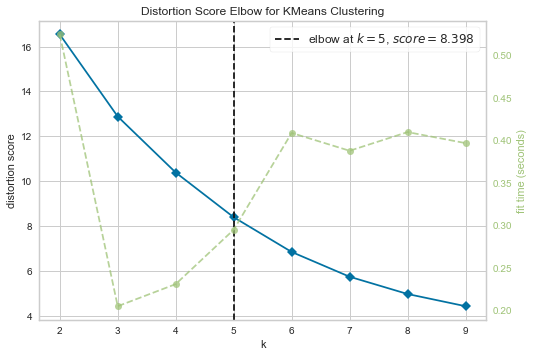

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [11]:
model = KMeans()
visualizer = KElbowVisualizer(estimator = model, k = (2,10))
visualizer.fit(uber_model)
visualizer.poof()

In [12]:
## It seems that for KMeans the ideal number of clusters is 5.

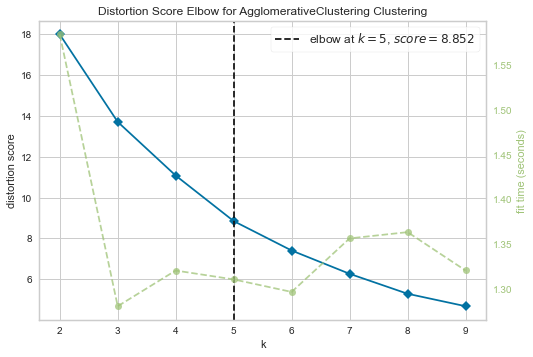

<AxesSubplot:title={'center':'Distortion Score Elbow for AgglomerativeClustering Clustering'}, xlabel='k', ylabel='distortion score'>

In [13]:
model = AgglomerativeClustering()
visualizer = KElbowVisualizer(estimator = model, k = (2,10))
visualizer.fit(uber_model)
visualizer.poof()

In [14]:
## It seems that for Agglomerativ clustering the ideal number of clusters is 4.

# KMEANS

In [15]:
kmeans = KMeans(n_clusters=5, max_iter=100)
kmeans.fit(uber_model)

KMeans(max_iter=100, n_clusters=5)

In [16]:
y_pred = kmeans.predict(uber_model)

In [17]:
print('silhouette score: ',silhouette_score(uber_model,y_pred))

silhouette score:  0.3789259991628253


In [18]:
## Add cluster to the dataset
uber['Clusters'] = kmeans.labels_

In [1]:
uber.head()

NameError: name 'uber' is not defined

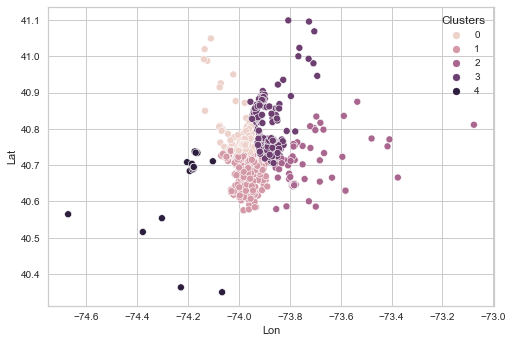

In [20]:
sns.scatterplot(data=uber, x='Lon', y='Lat', hue='Clusters')
plt.show()

In [21]:
centers = kmeans.cluster_centers_
centers

array([[ 40.75902644, -73.98185368],
       [ 40.71120227, -73.98646347],
       [ 40.66623111, -73.76162333],
       [ 40.79195271, -73.89382537],
       [ 40.67730877, -74.19115263]])

# AGGLOMERATIV CLUSTERING

In [22]:
agg_cluster = AgglomerativeClustering(n_clusters=4, affinity='euclidean', linkage='ward')
y_agg = agg_cluster.fit_predict(uber_model)

In [23]:
print('silhouette score: ',silhouette_score(uber_model,y_agg))

silhouette score:  0.6037178771053762


In [24]:
## Add cluster to the dataset
uber['agg_cluster'] = agg_cluster.labels_

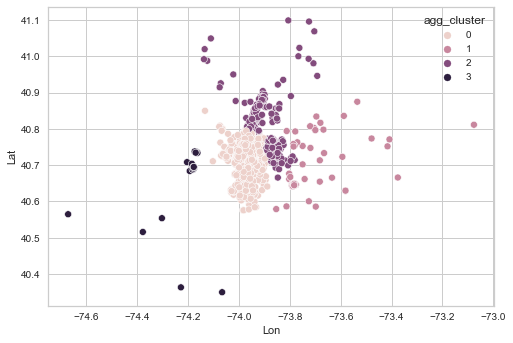

In [25]:
sns.scatterplot(data=uber, x='Lon', y='Lat', hue='agg_cluster')
plt.show()

# DBSCan

In [26]:
dbscan = DBSCAN(eps=0.01, min_samples=20,n_jobs=-1)
dbscan.fit(uber_model)
y_dbscan = dbscan.fit_predict(uber_model)

In [27]:
print('silhouette score: ',silhouette_score(uber_model,y_dbscan))

silhouette score:  0.3426329335762947


In [28]:
## Add cluster to the dataset
uber['dbscan_cluster'] = dbscan.labels_

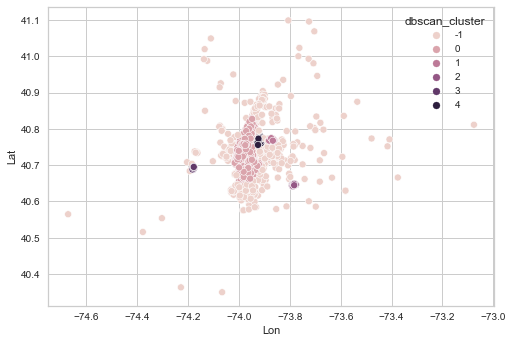

In [29]:
sns.scatterplot(data=uber, x='Lon', y='Lat', hue='dbscan_cluster')
plt.show()

In [30]:
uber.head()

,Date/Time,Lat,Lon,Base,Clusters,agg_cluster,dbscan_cluster
226165,8/27/2014 23:10:00,40.7741,-73.9609,B02598,0,0,0
710582,8/18/2014 15:45:00,40.7567,-74.0015,B02682,0,0,0
704493,8/17/2014 7:20:00,40.7323,-74.0079,B02682,1,0,0
6125,8/6/2014 14:17:00,40.7740,-73.8716,B02512,3,2,1
695561,8/15/2014 16:23:00,40.6839,-73.9812,B02682,1,0,0


In [31]:
uber['datetime'] = pd.to_datetime(uber['Date/Time'])

In [32]:
uber['hour']=uber.datetime.dt.hour
uber['weekday']=uber.datetime.dt.day_name()

In [33]:
uber.drop(columns='Date/Time', inplace=True )

In [34]:
uber.head()

,Lat,Lon,Base,Clusters,agg_cluster,dbscan_cluster,datetime,hour,weekday
226165,40.7741,-73.9609,B02598,0,0,0,2014-08-27 23:10:00,23,Wednesday
710582,40.7567,-74.0015,B02682,0,0,0,2014-08-18 15:45:00,15,Monday
704493,40.7323,-74.0079,B02682,1,0,0,2014-08-17 07:20:00,7,Sunday
6125,40.7740,-73.8716,B02512,3,2,1,2014-08-06 14:17:00,14,Wednesday
695561,40.6839,-73.9812,B02682,1,0,0,2014-08-15 16:23:00,16,Friday


# MODELS COMPARISON

C:\Users\paul\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\paul\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Lon', ylabel='Lat'>

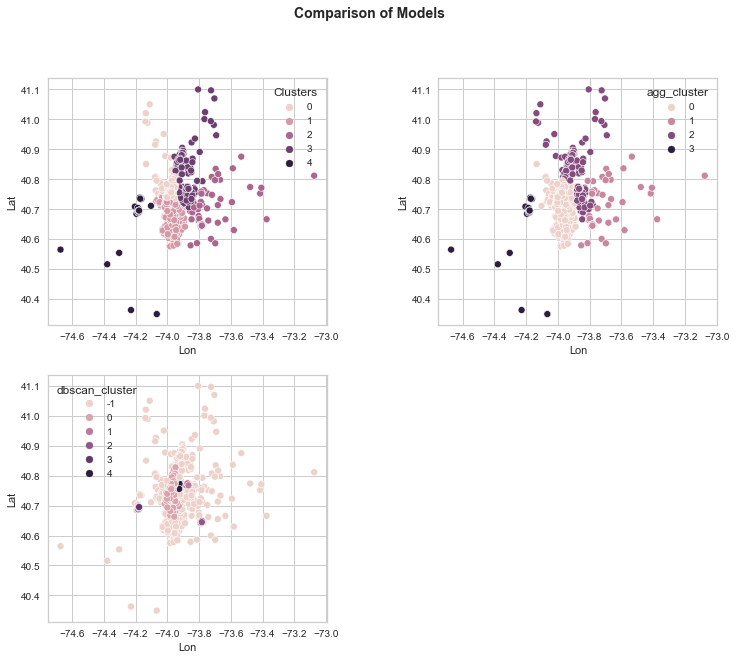

In [35]:
fig = plt.figure(figsize=(12, 10))
fig.subplots_adjust(hspace=0.2, wspace=0.4)
fig.suptitle('Comparison of Models ', fontsize=14, fontweight='bold')

ax_1 = fig.add_subplot(2, 2, 1)
ax_2 = fig.add_subplot(2, 2, 2)
ax_3 = fig.add_subplot(2, 2, 3)

sns.scatterplot(x='Lon', y='Lat', hue='Clusters', data=uber, ax=ax_1 )
sns.scatterplot("Lon","Lat", data=uber,  hue='agg_cluster',ax=ax_2)
sns.scatterplot("Lon","Lat", data=uber, hue='dbscan_cluster',ax=ax_3)

# MAP

In [36]:
import folium

In [37]:
def create_map(uber, cluster_column):
    m = folium.Map(location=[uber.Lat.mean(), uber.Lon.mean()], zoom_start=9, tiles='OpenStreet Map')
    for _, row in uber.iterrows():
        if row[cluster_column] == -1:
            cluster_colour = '#006400'
        elif row[cluster_column] == 0:
            cluster_colour = '#68228B'
            folium.CircleMarker(
                location= [row['Lat'], row['Lon']],
                radius=1,
                popup= row[cluster_column],
                color=cluster_colour,
                fill=True,
                fill_color=cluster_colour
            ).add_to(m)
    return m 

In [38]:
create_map(uber, 'Clusters')

In [39]:
create_map(uber, 'agg_cluster')

In [40]:
create_map(uber, 'dbscan_cluster')

In [ ]:
uber.to_csv(r'C:\Users\paul\Downloads\Uber_Models_Map.csv')